In [ ]:
Installing all the relevant libraries

In [ ]:
import pandas as pd
import numpy as np
!pip install BeautifulSoup4
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import requests

# For charts
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline

from bs4 import BeautifulSoup

import os
 # library for map rendering
import folium
!pip install geopy

# extract longitude and latitude from the address

from geopy.geocoders import Nominatim

print('All imports done successfully')

In [ ]:
Defining function to get New York City data

In [50]:
def get_newyorkcity_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    
    # all data is present in features label
    features=resp['features']
    
    # defining the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    
    # instantiate the dataframe
    nyc_data = pd.DataFrame(columns=column_names)
    
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        
        neighborhood_dim = data['geometry']['coordinates']
        neighborhood_latdim = neighborhood_dim[1]
        neighborhood_longdim = neighborhood_dim[0]
    
        nyc_data = nyc_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_latdim,
                                          'Longitude': neighborhood_longdim}, ignore_index=True)
    
    return nyc_data

In [ ]:
Call the FourSquare function to get top 100 venue details within a radius of 1km for a given latitude and longitude value

In [39]:
def get_venues(lat,lng):
    
    radius=1000
    LIMIT=100
    CLIENT_ID = 'BXO31LZCUF5CIUV030DYRF3XO2J043Q4PIDYNSVEZLV5XDJR' 
    CLIENT_SECRET = 'J3MGQ3T4C21E1HPU1MNUA43NRZPYGL1YGSM1MMH5IRFVN3ZN'
    VERSION = '20190425' 
    
    #url with above defined parameters to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    print(results)
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

In [ ]:
Defining a function to retrieve details like Ratings, Tips

In [96]:
def get_additionalvenue_details(venue_id):
        
    CLIENT_ID = 'BXO31LZCUF5CIUV030DYRF3XO2J043Q4PIDYNSVEZLV5XDJR' # my Foursquare ID
    CLIENT_SECRET = 'J3MGQ3T4C21E1HPU1MNUA43NRZPYGL1YGSM1MMH5IRFVN3ZN' # my Foursquare Secret
    VERSION = '20190425' # Foursquare API version
    
    #url formation
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    

    results = requests.get(url).json()
    #print(results['response']['venue'])
    venue_add_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_add_data['id']
        venue_name=venue_add_data['name']
        venue_likes=venue_add_data['likes']['count']
        venue_rating=venue_add_data['rating']
        venue_tips=venue_add_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
        
    column_headers=['ID','Name','Likes','Rating','Tips']
    df_ratings = pd.DataFrame(venue_details,columns=column_names)
    return df_ratings

In [ ]:
Fetching New York data and verifying using the head() function

In [54]:
nyc_data=get_newyorkcity_data()
nyc_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [55]:
nyc_data.shape

(306, 4)

In [ ]:
Since I'm experiencing timeout, dividing this list into 3 of 103 each

In [41]:
new_york_data1=nyc_data.iloc[:103]
new_york_data2=nyc_data.iloc[103:206]
new_york_data3=nyc_data.iloc[206:]
print('Splitting done')

Splitting done


In [ ]:
Now out of these 306 restaurant, we are seggregating list of all Indian restaurants in NYC
This is the first list

In [42]:
column_headers=['Borough', 'Neighborhood', 'ID','Name']
indian_nyc_restaurants1 = pd.DataFrame(columns=column_headers)
                                      
iteration_counter=1
                                      
#iterate through each restaurant, check if the type is Indian and then add it to indian_nyc_restaurants dataframe
                                      
for row in new_york_data1.values.tolist():
    #print(row)
    Borough, Neighborhood, Latitude, Longitude=row
    #print (Longitude)
    venues = get_venues(Latitude,Longitude)
    indian_rest=venues[venues['Category']=='Indian Restaurant']   
    for rest_detail in indian_rest.values.tolist():
        id, name , category=rest_detail
        indian_nyc_restaurants1 = indian_nyc_restaurants1.append({'Borough': Borough,
                                                'Neighbourhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    iteration_counter+=1
                                      
#indian_nyc_restaurants1.head()
#indian_nyc_restaurants1.shape

{'meta': {'code': 200, 'requestId': '5ef4ec3bf9762512a1393e59'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Wakefield', 'headerFullLocation': 'Wakefield, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 48, 'suggestedBounds': {'ne': {'lat': 40.903705185610015, 'lng': -73.83531662200086}, 'sw': {'lat': 40.88570516760999, 'lng': -73.85908441909719}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c537892fd2ea593cb077a28', 'name': 'Lollipops Gelato', 'location': {'address': '4120 Baychester Ave', 'crossStreet': 'Edenwald & Bussing Ave', 'lat': 40.894123150205274, 'lng': -73.84589162362325, 'labeledLatLngs': [{'label': 'display', 'lat': 40.894123150205274, 'lng': -73.84589162362325}, {'label': 'entrance',

In [ ]:
This is the second list

In [ ]:
column_headers=['Borough', 'Neighborhood', 'ID','Name']
indian_nyc_restaurants2 = pd.DataFrame(columns=column_headers)
                                      
iteration_counter=1
                                      
#iterate through each restaurant, check if the type is Indian and then add it to indian_nyc_restaurants dataframe
                                      
for row in new_york_data2.values.tolist():
    #print(row)
    Borough, Neighborhood, Latitude, Longitude=row
    #print (Longitude)
    venues = get_venues(Latitude,Longitude)
    indian_rest=venues[venues['Category']=='Indian Restaurant']   
    for rest_detail in indian_rest.values.tolist():
        id, name , category=rest_detail
        indian_nyc_restaurants2 = indian_nyc_restaurants2.append({'Borough': Borough,
                                                'Neighbourhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    iteration_counter+=1
                                      
#indian_nyc_restaurants2.head()
#indian_nyc_restaurants2.shape

{'meta': {'code': 200, 'requestId': '5ef4f0b7564b600a1257eb54'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'West Harlem', 'headerFullLocation': 'West Harlem, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 142, 'suggestedBounds': {'ne': {'lat': 40.83260429381195, 'lng': -73.93781676953219}, 'sw': {'lat': 40.814604275811924, 'lng': -73.96155906813513}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '572e70e4498e66d841e9c25e', 'name': 'R.O.K.C', 'location': {'address': '3452 Broadway', 'crossStreet': 'btwn W. 140 & W. 141 St', 'lat': 40.82365436586723, 'lng': -73.95250628936665, 'labeledLatLngs': [{'label': 'display', 'lat': 40.82365436586723, 'lng': -73.9525062893

In [ ]:
This is the third list

In [ ]:
column_headers=['Borough', 'Neighborhood', 'ID','Name']
indian_nyc_restaurants3 = pd.DataFrame(columns=column_headers)
                                      
iteration_counter=1
                                      
#iterate through each restaurant, check if the type is Indian and then add it to indian_nyc_restaurants dataframe
                                      
for row in new_york_data3.values.tolist():
    #print(row)
    Borough, Neighborhood, Latitude, Longitude=row
    #print (Longitude)
    venues = get_venues(Latitude,Longitude)
    indian_rest=venues[venues['Category']=='Indian Restaurant']   
    for rest_detail in indian_rest.values.tolist():
        id, name , category=rest_detail
        indian_nyc_restaurants3 = indian_nyc_restaurants3.append({'Borough': Borough,
                                                'Neighbourhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    iteration_counter+=1
                                      
#indian_nyc_restaurants3.head()
#indian_nyc_restaurants3.shape

In [ ]:
Moving the Dataframe to a csv file

In [ ]:
files=[indian_nyc_restaurants1,indian_nyc_restaurants2,indian_nyc_restaurants3]
indian_restaurants_nyc=pd.concat(files)
indian_restaurants_nyc.to_csv('indian_restaurants_nyc.csv', index=False)


In [72]:
indian_restaurants_nyc=pd.read_csv('indian_restaurants_nyc.csv')

In [ ]:
Let's visualize which borough us the most concentrated with Indian Restaurants

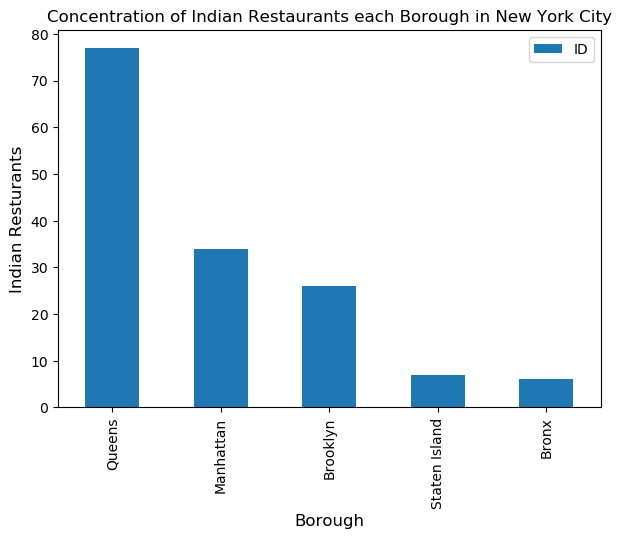

In [73]:
plt.figure(figsize=(7,5), dpi = 100)

plt.title('Concentration of Indian Restaurants each Borough in New York City')
#On x-axis
plt.xlabel('Borough in NYC', fontsize = 12)
#On y-axis
plt.ylabel('Indian Resturants', fontsize=12)

indian_restaurants_nyc.groupby('Borough')['ID'].count().nlargest(5).plot(kind='bar')

plt.legend()

#displays the plot
plt.show()

In [ ]:
Now let's visualize the concentration of restaurants in each neighborhood

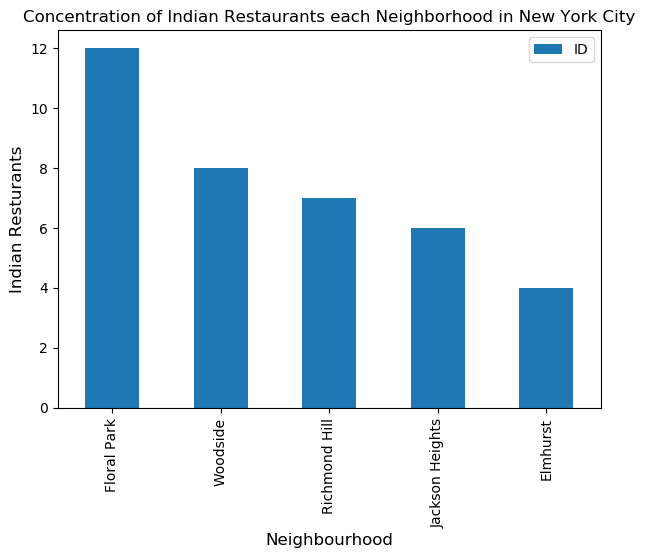

In [68]:
plt.figure(figsize=(7,5), dpi = 100)

plt.title('Concentration of Indian Restaurants each Neighborhood in New York City')
#On x-axis
plt.xlabel('Each Neighborhood in NYC', fontsize = 12)
#On y-axis
plt.ylabel('Indian Resturants', fontsize=12)

indian_restaurants_nyc.groupby('Neighbourhood')['ID'].count().nlargest(5).plot(kind='bar')

plt.legend()

#displays the plot
plt.show()

In [ ]:


column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
indian_rest_stats_ny=pd.DataFrame(columns=column_names)
count=1


for row in indian_restaurants_nyc.values.tolist():
    Borough,ID,Name,Neighborhood=row
    try:
        venue_details=get_additionalvenue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        # we will assign 0 value for these resturants as they may have been 
        #recently opened or details does not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(indian_restaurants_nyc),')','processed')
    indian_rest_stats_ny = indian_rest_stats_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1


In [ ]:
indian_rest_stats_ny.to_csv('indian_restaurants_ratings_nyc.csv', index=False)

In [100]:
indian_restaurants_ratings_nyc=pd.read_csv('indian_restaurants_ratings_nyc.csv')

In [101]:
indian_restaurants_ratings_nyc.head()

,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
0,Bronx,Woodlawn,4c0448d9310fc9b6bf1dc761,Curry Spot,5,7.8,10
1,Bronx,Parkchester,4c194631838020a13e78e561,Melanies Roti Bar And Grill,3,6.0,2
2,Bronx,Spuyten Duyvil,4c04544df423a593ac83d116,Cumin Indian Cuisine,13,6.0,9
3,Bronx,Concourse,551b7f75498e86c00a0ed2e1,Hungry Bird,8,6.8,3
4,Bronx,Unionport,4c194631838020a13e78e561,Melanies Roti Bar And Grill,3,6.0,2


In [102]:
indian_restaurants_ratings_nyc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Borough       145 non-null    object 
 1   Neighborhood  145 non-null    object 
 2   ID            145 non-null    object 
 3   Name          145 non-null    object 
 4   Likes         145 non-null    int64  
 5   Rating        145 non-null    float64
 6   Tips          145 non-null    int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 8.1+ KB


In [ ]:
Since there is alot of nulls, converting this to float

In [103]:
indian_restaurants_ratings_nyc['Likes']=indian_restaurants_ratings_nyc['Likes'].astype('float64')
indian_restaurants_ratings_nyc['Tips']=indian_restaurants_ratings_nyc['Tips'].astype('float64')

In [ ]:
Now lets find out the highest rated restaurant

In [104]:
indian_restaurants_ratings_nyc.iloc[indian_restaurants_ratings_nyc['Rating'].idxmax()]

Borough                           Queens
Neighborhood                     Astoria
ID              4aa56c81f964a5204e4820e3
Name                 Seva Indian Cuisine
Likes                                239
Rating                                 9
Tips                                 133
Name: 53, dtype: object

In [105]:
indian_restaurants_ratings_nyc.iloc[indian_restaurants_ratings_nyc['Likes'].idxmax()]

Borough                        Manhattan
Neighborhood                     Tribeca
ID              4bbb9dbded7776b0e1ad3e51
Name                    Tamarind TriBeCa
Likes                                590
Rating                               8.6
Tips                                 148
Name: 41, dtype: object

In [106]:
indian_restaurants_ratings_nyc.iloc[indian_restaurants_ratings_nyc['Tips'].idxmax()]

Borough                        Manhattan
Neighborhood                    Gramercy
ID              4a12eb1ff964a52099771fe3
Name                               Dhaba
Likes                                497
Rating                               8.3
Tips                                 164
Name: 50, dtype: object

In [108]:
nyc_neighborhood_averagerating=indian_restaurants_ratings_nyc.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
nyc_neighborhood_averagerating.columns=['Neighborhood','Average Rating']
nyc_neighborhood_averagerating.sort_values(['Average Rating'],ascending=False).head(15)

,Neighborhood,Average Rating
0,Astoria,9.000000
61,Sunnyside,9.000000
6,Blissville,9.000000
14,Clinton Hill,8.800000
25,Fort Greene,8.800000
48,Prospect Heights,8.700000
30,Greenwich Village,8.600000
65,Tribeca,8.600000
13,Civic Center,8.600000
63,Sutton Place,8.500000


In [109]:
nyc_neighborhood_averagerating=indian_restaurants_ratings_nyc.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
nyc_neighborhood_averagerating.columns=['Borough','Average Rating']
nyc_neighborhood_averagerating.sort_values(['Average Rating'],ascending=False).head(15)

,Borough,Average Rating
2,Manhattan,8.121212
1,Brooklyn,7.429630
0,Bronx,6.566667
3,Queens,6.478378
4,Staten Island,6.400000


In [111]:
nyc_neighborhood_averagerating=nyc_neighborhood_averagerating[nyc_neighborhood_averagerating['Average Rating']>=8.0]
nyc_neighborhood_averagerating

,Borough,Average Rating
2,Manhattan,8.121212


In [119]:
nyc_neighborhood_averagerating=indian_restaurants_ratings_nyc.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
nyc_neighborhood_averagerating.columns=['Neighborhood','Average Rating']


nyc_neighborhood_averagerating=pd.merge(nyc_neighborhood_averagerating,nyc_data, on='Neighborhood')
nyc_neighborhood_averagerating=nyc_neighborhood_averagerating[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]

nyc_neighborhood_averagerating.sort_values(['Average Rating'],ascending=False)



,Borough,Neighborhood,Latitude,Longitude,Average Rating
0,Queens,Astoria,40.768509,-73.915654,9.000000
62,Staten Island,Sunnyside,40.612760,-74.097126,9.000000
6,Queens,Blissville,40.737251,-73.932442,9.000000
61,Queens,Sunnyside,40.740176,-73.926916,9.000000
25,Brooklyn,Fort Greene,40.688527,-73.972906,8.800000
14,Brooklyn,Clinton Hill,40.693229,-73.967843,8.800000
48,Brooklyn,Prospect Heights,40.676822,-73.964859,8.700000
13,Manhattan,Civic Center,40.715229,-74.005415,8.600000
30,Manhattan,Greenwich Village,40.726933,-73.999914,8.600000
66,Manhattan,Tribeca,40.721522,-74.010683,8.600000


In [121]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude

In [122]:
newyorkcity_map = folium.Map(location=geo_location('New York'), zoom_start=15)

# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the neighborhood and add each to the feature group
for lat, lng, in nyc_neighborhood_averagerating[['Latitude','Longitude']].values:
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, 
            color='green',
            fill=True,
            fill_color='yellow',
            fill_opacity=0.5
        )
    )

In [123]:
nyc_neighborhood_averagerating['Label']=nyc_neighborhood_averagerating['Neighborhood']+', '+nyc_neighborhood_averagerating['Borough']+'('+nyc_neighborhood_averagerating['Average Rating'].map(str)+')'

In [125]:
for lat, lng, label in nyc_neighborhood_averagerating[['Latitude','Longitude','Label']].values:
    folium.Marker([lat, lng], popup=label).add_to(newyorkcity_map)        
# add incidents to map
newyorkcity_map.add_child(incidents)

In [127]:
#Plotting a graph with restaurants with rating above 8
nyc_neighborhood_averagerating=nyc_neighborhood_averagerating[nyc_neighborhood_averagerating['Average Rating']>=8.0]
nyc_neighborhood_averagerating
for lat, lng, label in nyc_neighborhood_averagerating[['Latitude','Longitude','Label']].values:
    folium.Marker([lat, lng], popup=label).add_to(newyorkcity_map)        
# add incidents to map
newyorkcity_map.add_child(incidents)